In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

import requests
import json

import sys
sys.path.append('../report_code/')
import importlib

import util_scripts as util


In [2]:
import os
from dotenv import load_dotenv

from pymongo.mongo_client import MongoClient
from pymongo.server_api import ServerApi

MONGO_DBR_URI = os.getenv('MONGO_DBR_URI')

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
#importlib.reload(util)

In [5]:
# reload_data_api = False
# records = []

# if (reload_data_api):
#     DATA_API_URL = "https://upwins.azurewebsites.net/api/find"
#     response = requests.post(DATA_API_URL)
#     records = json.loads(response.text)

#     # save the response to a file
#     with open("../report_data/response.txt", "w") as f:
#         f.write(response.text)

# else:
#     # open the response from a file
#     with open("../report_data/response.txt", "r") as f:
#         response_text = f.read()
    
#     records = json.loads(response_text)

# df = pd.DataFrame(records)

In [6]:
reload_data_driver = False

if (reload_data_driver):

    records = []

    # Create a new client and connect to the server
    client = MongoClient(MONGO_DBR_URI, server_api=ServerApi('1'))

    # Send a ping to confirm a successful connection
    try:
        client.admin.command('ping')
        print("Pinged your deployment. You successfully connected to MongoDB!")
    except Exception as e:
        print(e)

    db = client["upwins_db"]
    view_name = "spectral_library"
    spectral_library = db[view_name]

    records = spectral_library.find()

    df = pd.DataFrame(records)
    df.to_pickle('../report_data/data.pkl')

else:
    df = pd.read_pickle('../report_data/data.pkl')

## Spectral Library

Number of Spectra: `{python} len(df)`

In [7]:
sc = util.SpectralCollection(df)

In [8]:
#len(df)

In [9]:
#| label: table1
#| fig-cap: Spectra totals for each species
#| column: page-inset-right

codes = ['part', 'age', 'health', 'bloom']
list_by = 'name'

pd.set_option('display.max_columns', None)

table = sc.df_with_codes(codes, list_by)

table

,Total,FL,FR,L,LG,MX,SE,SP,ST,1G,D,J,M,PE,RE,DS,H,LLRZ,MH,R,S,SS,SY,FFG,FLG,FRG
Ammophila_breviligulata,254,0,0,202,0,22,0,0,0,5,3,185,61,0,0,28,71,0,4,0,0,68,57,0,0,0
Baccharis_halimifolia,260,12,0,217,11,4,0,3,13,76,0,76,104,0,4,37,177,0,0,0,0,46,0,0,45,0
Chamaecrista_fasciculata,83,24,0,31,0,14,0,9,0,21,0,19,22,9,4,24,37,0,0,0,0,0,0,7,54,0
Chasmanthium_latifolium,285,0,6,157,0,44,31,0,33,132,11,48,4,13,59,30,212,0,0,0,0,17,0,13,32,35
Ilex_vomitoria,123,0,0,47,16,47,0,0,13,0,0,65,7,6,3,7,74,0,0,0,0,0,0,0,0,0
Iva_frutescens,305,0,0,286,4,3,3,9,0,5,0,15,193,0,92,46,113,18,0,0,0,61,58,0,15,0
Morella_pennsylvanica,202,0,14,188,0,0,0,0,0,5,0,0,197,0,0,74,23,0,0,0,0,62,43,22,7,9
Panicum_amarum,386,18,0,278,0,48,11,0,27,46,0,251,24,54,11,31,225,0,0,0,0,62,64,20,50,17
Panicum_virgatum,420,93,0,244,0,29,38,9,3,16,3,326,15,32,7,41,165,0,0,0,0,122,59,0,190,0
Robinia_hispida,184,0,0,75,32,33,0,0,44,113,0,53,18,0,0,13,171,0,0,0,0,0,0,0,0,0


In [10]:
#sc.plot_mean_spectrum_each_species()

In [11]:
# species_list = [
#     'Chasmanthium_latifolium',
#     'Ammophila_breviligulata',
#     'Panicum_amarum',
#     'Panicum_virgatum'
# ]

# filter = {
#     'name': '',
#     #'fname': '',
#     #'genus': '',
#     #'species': '',
#     #'age': '',
#     'health': 'H',
#     'part': 'L',
#     #'type': '',
#     #'bloom': '',
#     #'date': ''
# }

# plotby = 'age'

# for species in species_list:
#     filter['name'] = species
#     sc.plot_with_filter(filter, plotby)


In [12]:
# species_list = [
#     #'Chasmanthium_latifolium',
#     #'Ammophila_breviligulata',
#     #'Panicum_amarum',
#     #'Panicum_virgatum',
#     'Baccharis_halimifolia',
#     #'Iva_frutescens',
#     #'Solidago_sempervirens',
#     #'Robinia_hispida',
#     #'Morella_pennsylvanica',
#     #'Rosa_rugosa',
#     #'Chamaecrista_fasciculata',
#     #'Solidago_rugosa',
#     #'Ilex_vomitoria'

# ]

# filter = {
#     'name': '',
#     'health': 'H',
#     'part': 'FL'
# }

# plotby = 'fname'

# for species in species_list:
#     filter['name'] = species
#     sc.plot_with_filter(filter, plotby)

In [13]:
# species_list = [
#     #'Chasmanthium_latifolium',
#     #'Ammophila_breviligulata',
#     #'Panicum_amarum',
#     #'Panicum_virgatum',
#     'Baccharis_halimifolia',
#     #'Iva_frutescens',
#     'Solidago_sempervirens',
#     #'Robinia_hispida',
#     #'Morella_pennsylvanica',
#     #'Rosa_rugosa',
#     'Chamaecrista_fasciculata',
#     'Solidago_rugosa',
#     #'Ilex_vomitoria'

# ]

# filter = {
#     'name': '',
#     'health': 'H'
# }

# plotby = 'part'

# for species in species_list:
#     filter['name'] = species
#     sc.plot_with_filter(filter, plotby)

## Same part of same plant over time (by age)

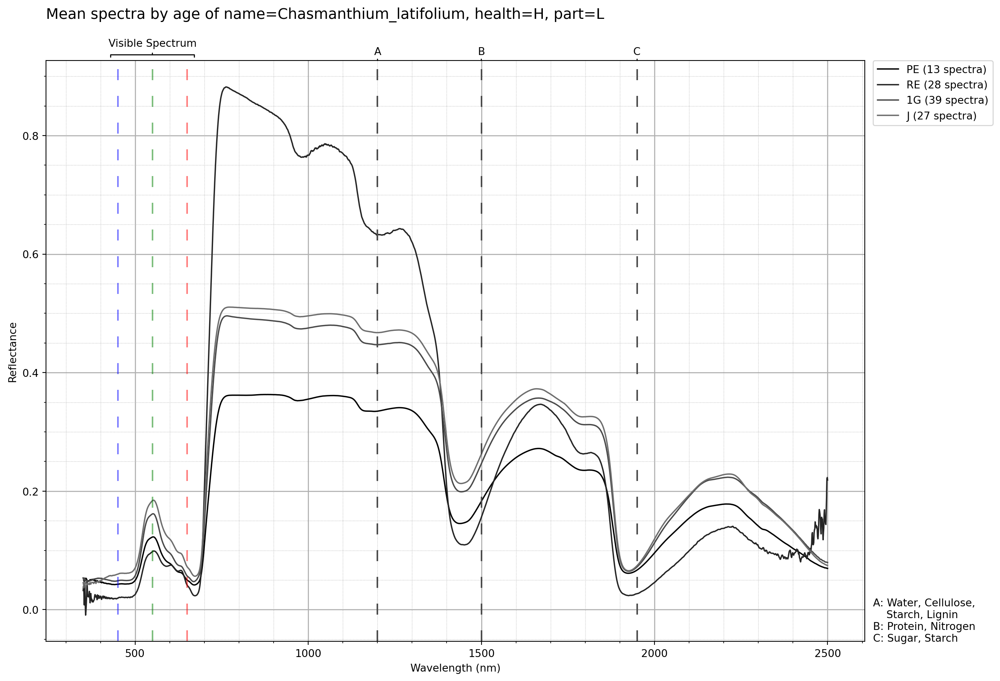

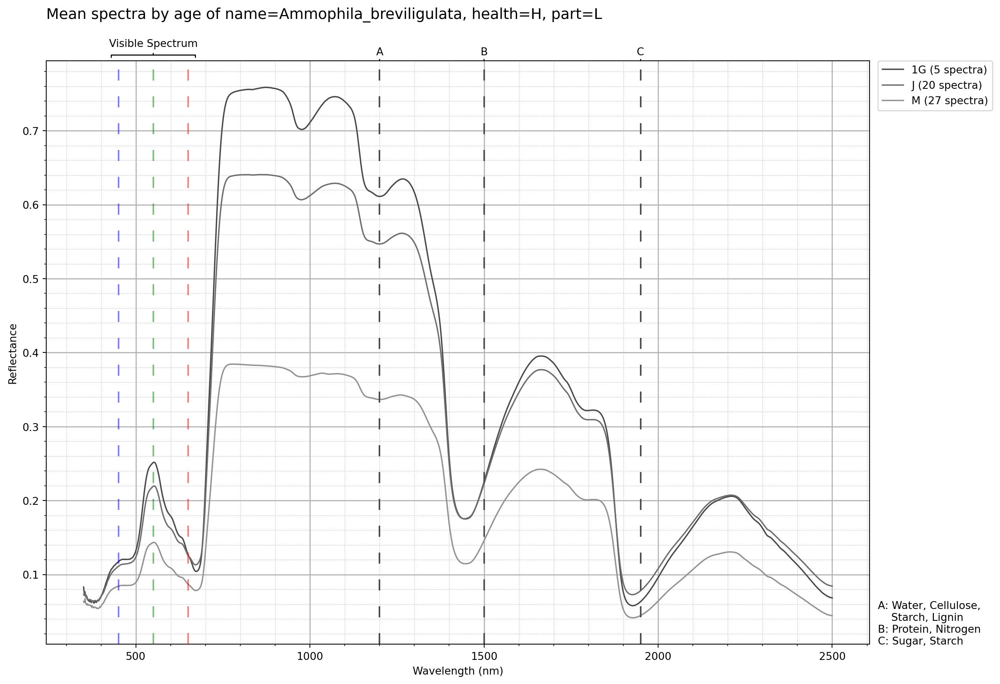

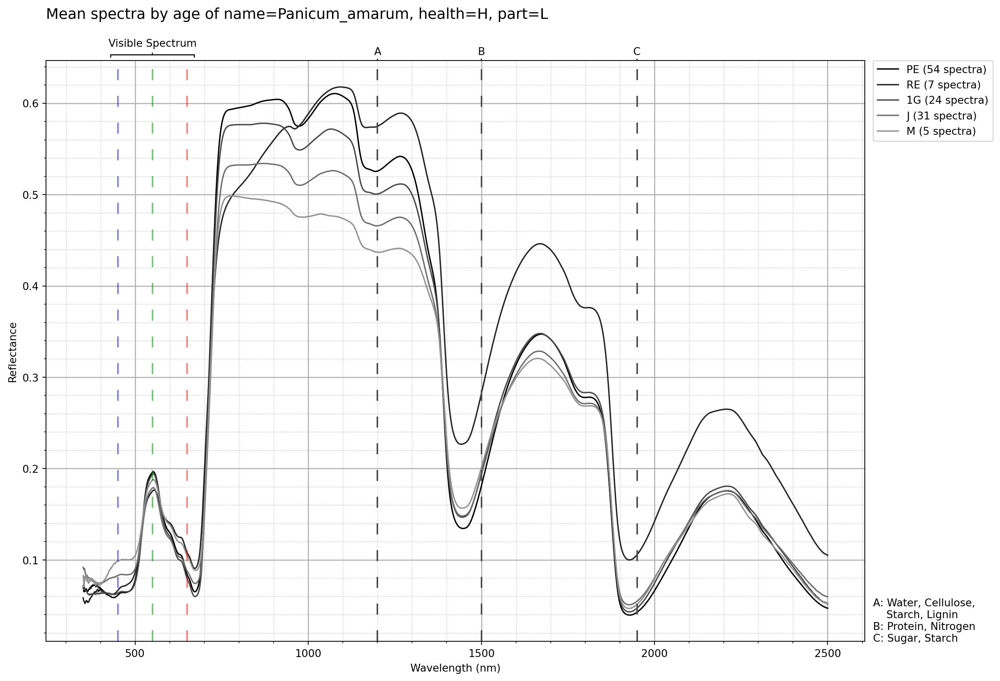

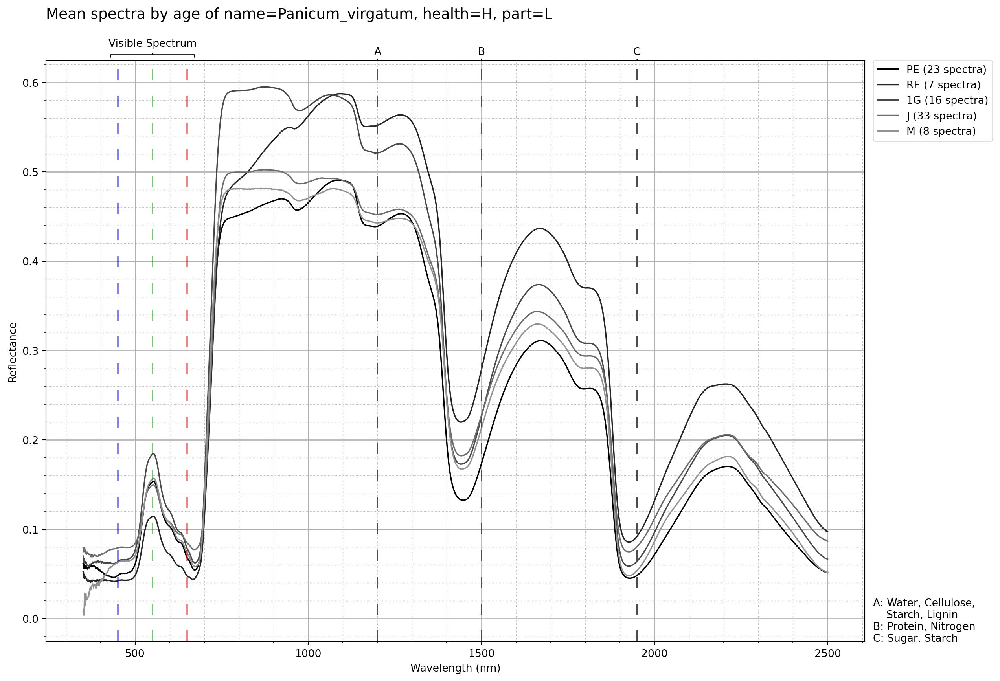

In [14]:
#| column: page

species_list = [
    'Chasmanthium_latifolium',
    'Ammophila_breviligulata',
    'Panicum_amarum',
    'Panicum_virgatum',
    #'Baccharis_halimifolia',
    #'Iva_frutescens',
    #'Solidago_sempervirens',
    #'Robinia_hispida',
    #'Morella_pennsylvanica',
    #'Rosa_rugosa',
    #'Chamaecrista_fasciculata',
    #'Solidago_rugosa',
    #'Ilex_vomitoria'

]

filter = {
    'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    #'age': '',
    'health': 'H',
    'part': 'L',
    #'type': '',
    #'bloom': '',
    #'date': ''
}

plotby = 'age'

for species in species_list:
    filter['name'] = species
    sc.plot_with_filter(filter, plotby)

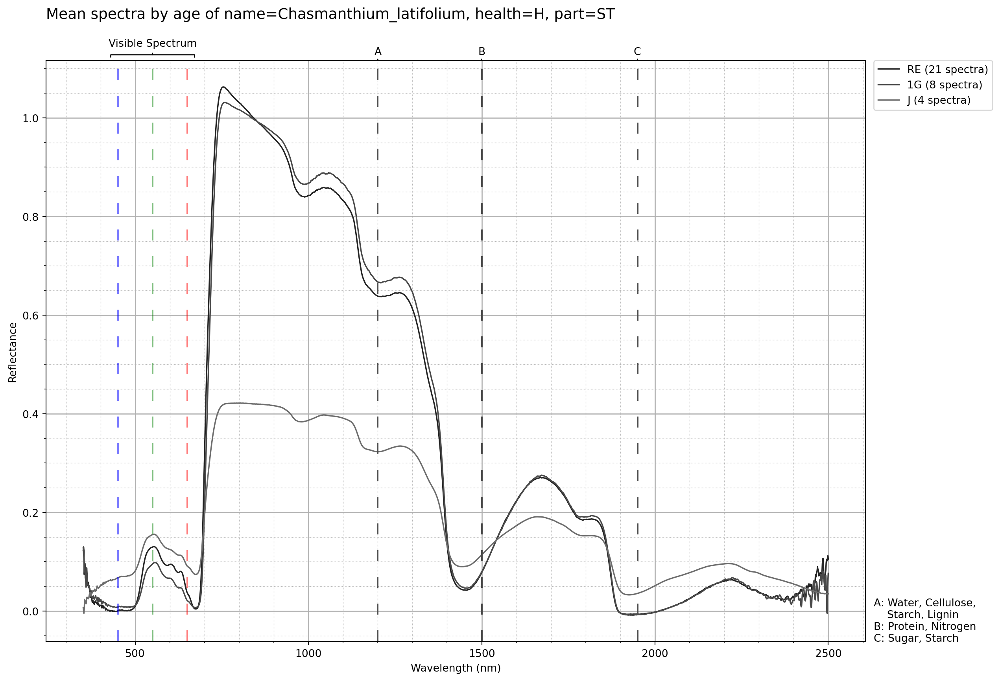

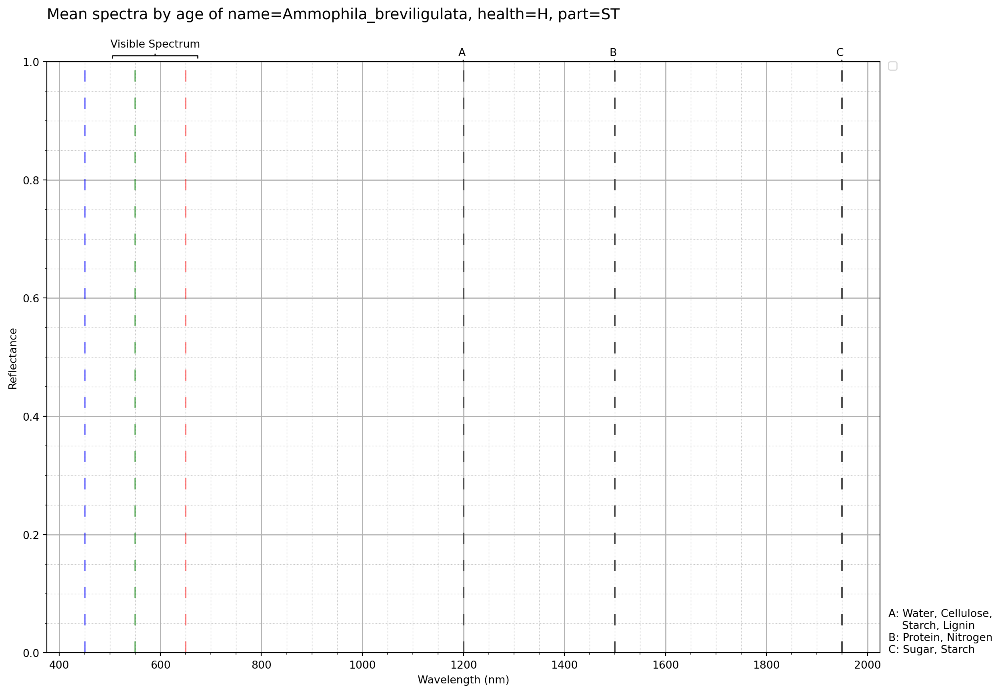

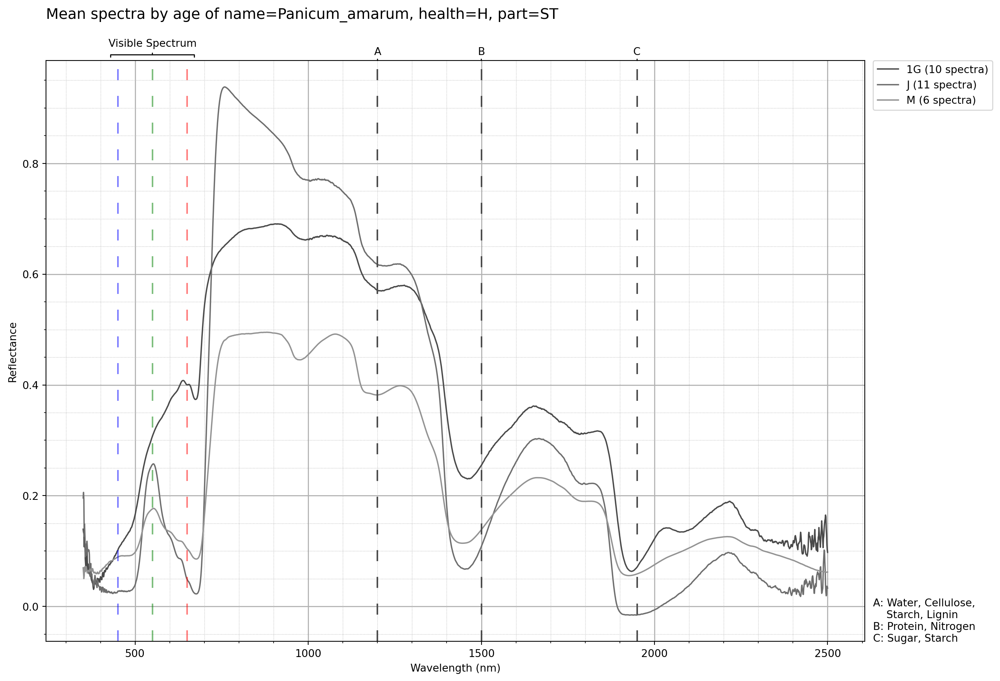

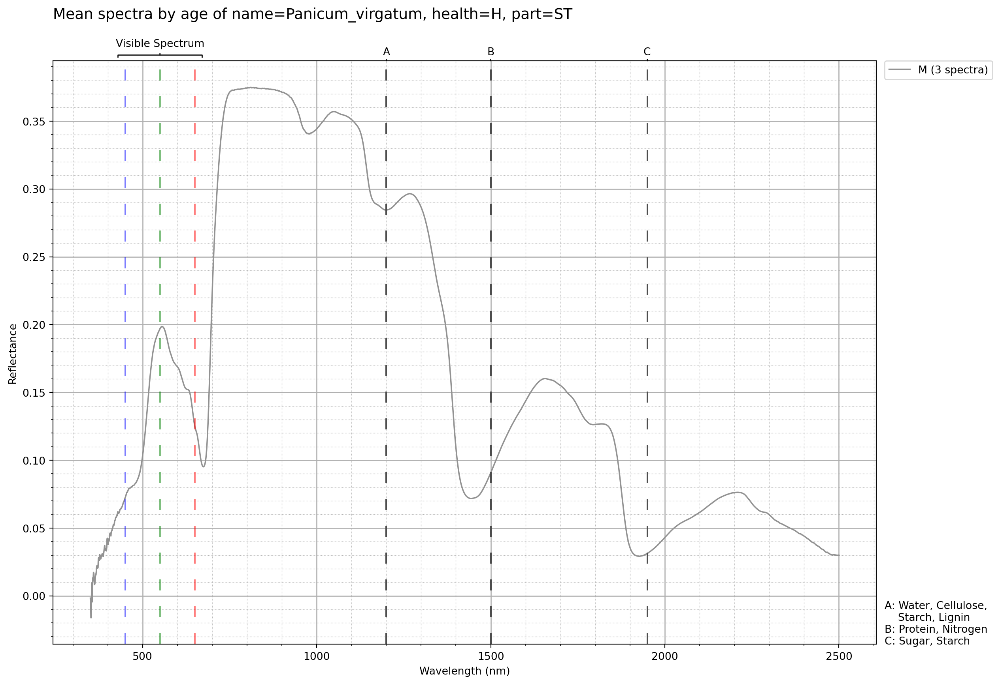

In [15]:
#| column: page

species_list = [
    'Chasmanthium_latifolium',
    'Ammophila_breviligulata',
    'Panicum_amarum',
    'Panicum_virgatum',
    #'Baccharis_halimifolia',
    #'Iva_frutescens',
    #'Solidago_sempervirens',
    #'Robinia_hispida',
    #'Morella_pennsylvanica',
    #'Rosa_rugosa',
    #'Chamaecrista_fasciculata',
    #'Solidago_rugosa',
    #'Ilex_vomitoria'

]

filter = {
    'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    #'age': '',
    'health': 'H',
    'part': 'ST',
    #'type': '',
    #'bloom': '',
    #'date': ''
}

plotby = 'age'

for species in species_list:
    filter['name'] = species
    sc.plot_with_filter(filter, plotby)

## Different parts of the same plant over time

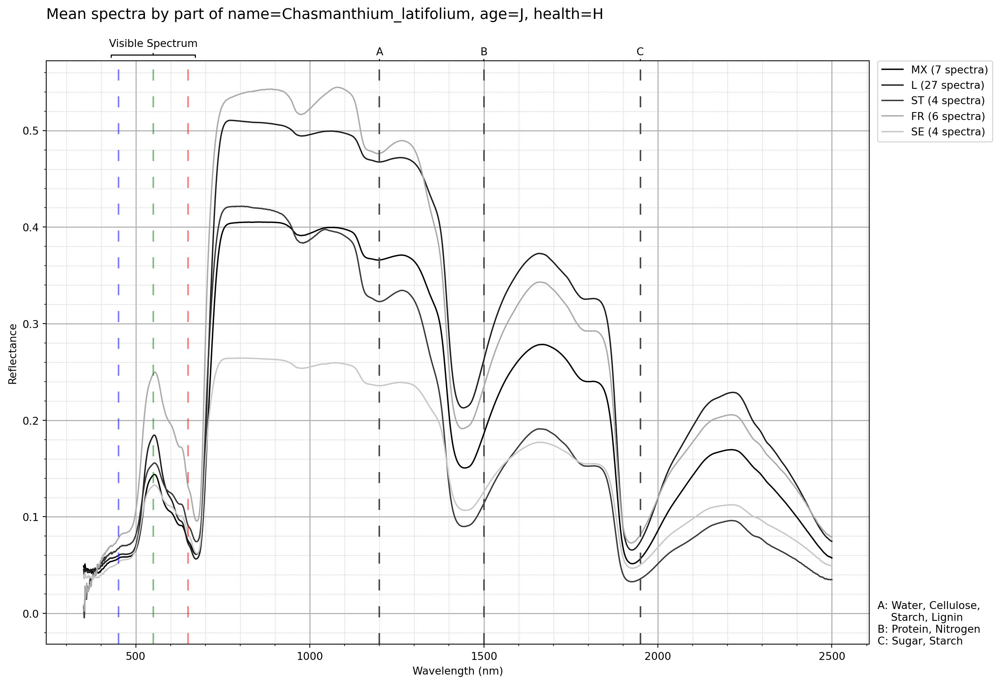

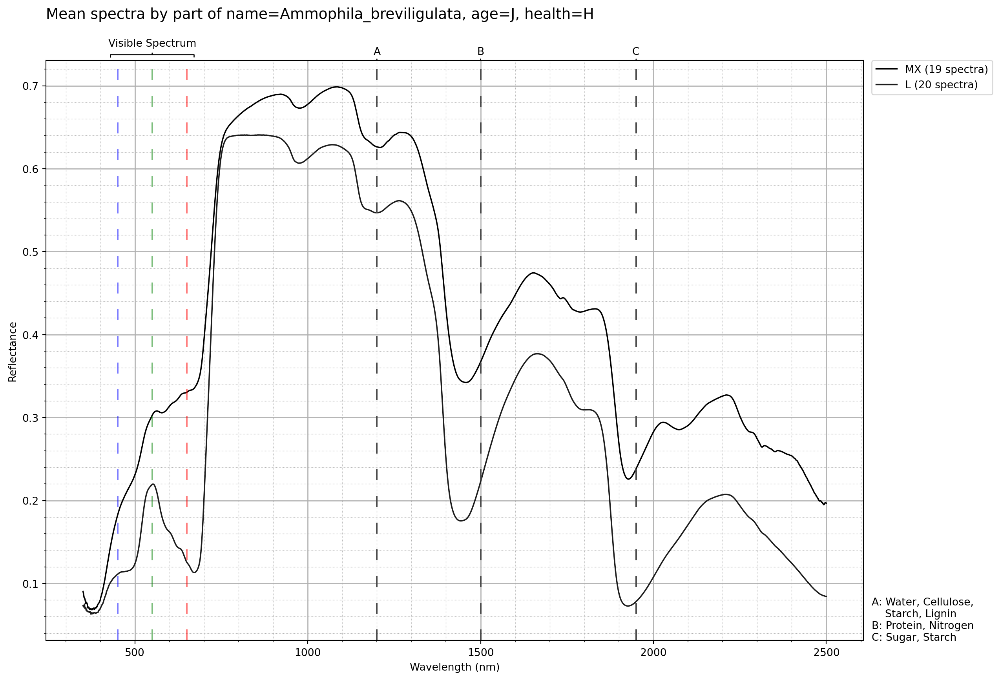

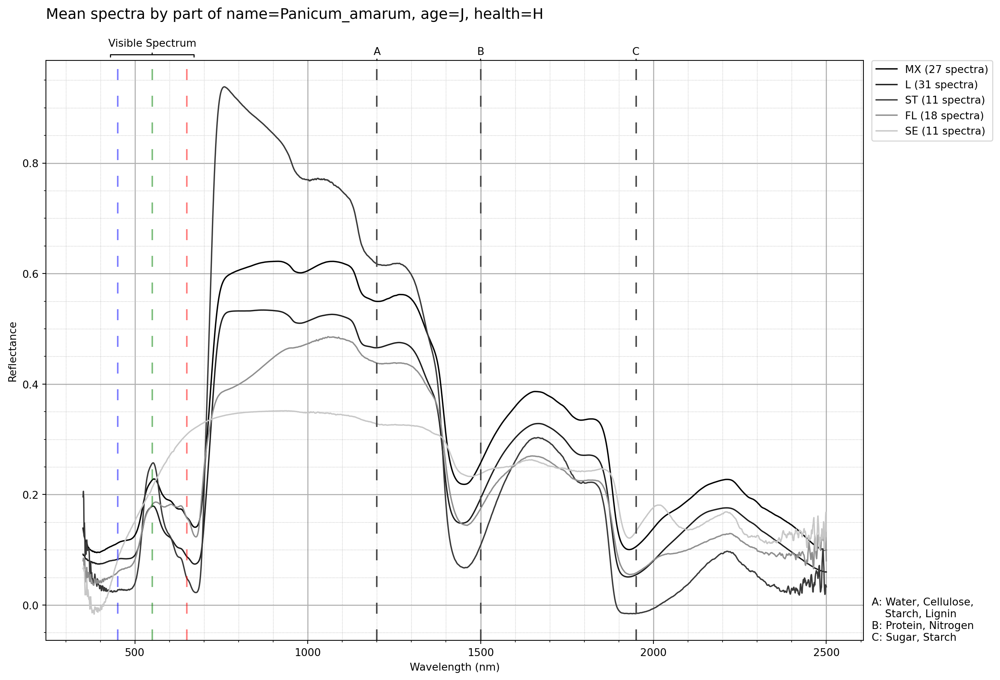

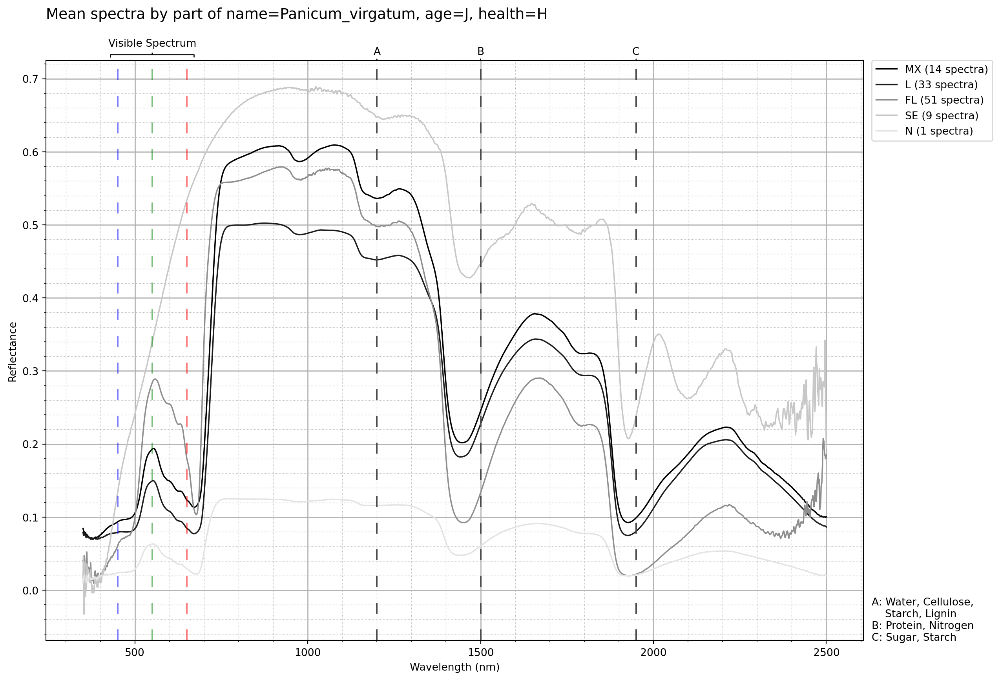

In [16]:
#| column: page

species_list = [
    'Chasmanthium_latifolium',
    'Ammophila_breviligulata',
    'Panicum_amarum',
    'Panicum_virgatum',
    #'Baccharis_halimifolia',
    #'Iva_frutescens',
    #'Solidago_sempervirens',
    #'Robinia_hispida',
    #'Morella_pennsylvanica',
    #'Rosa_rugosa',
    #'Chamaecrista_fasciculata',
    #'Solidago_rugosa',
    #'Ilex_vomitoria'

]

filter = {
    'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    'age': 'J',
    'health': 'H',
    #'part': '',
    #'type': '',
    #'bloom': '',
    #'date': ''
}

plotby = 'part'

for species in species_list:
    filter['name'] = species
    sc.plot_with_filter(filter, plotby)

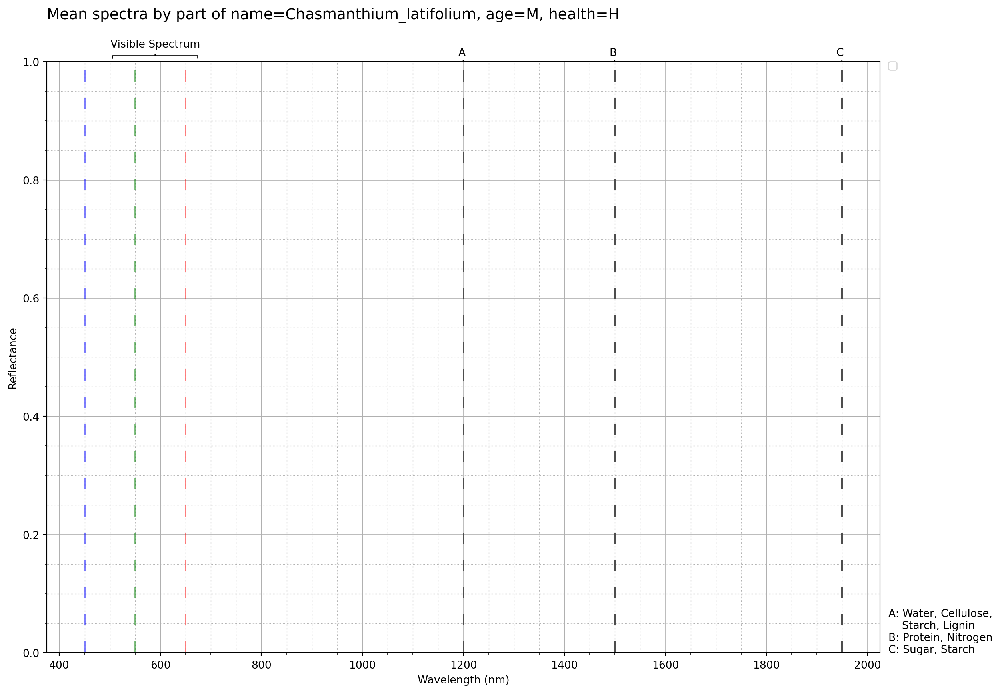

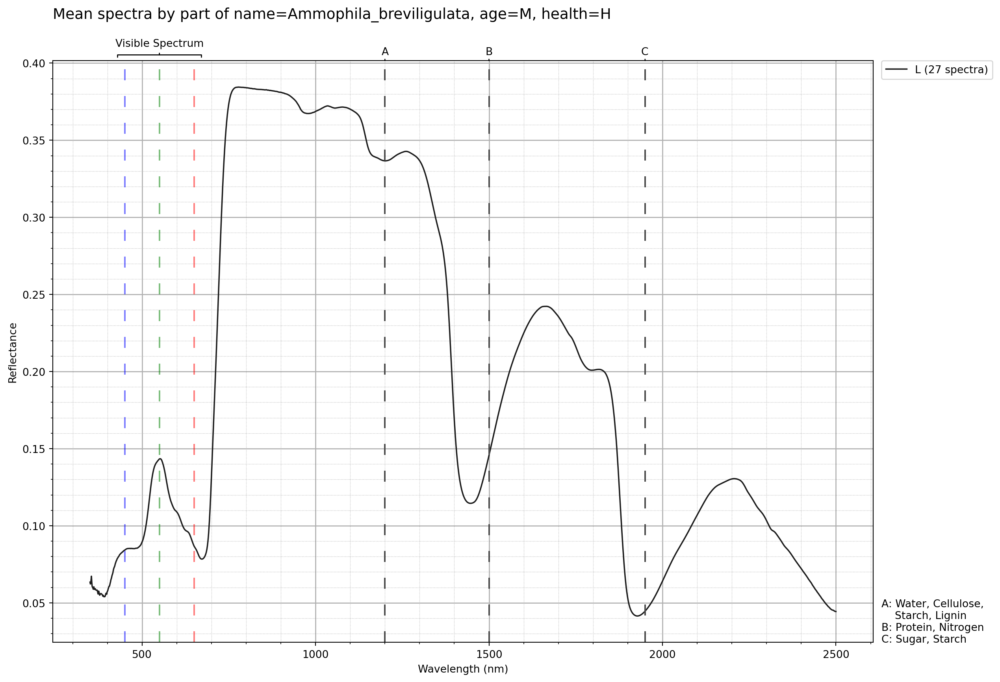

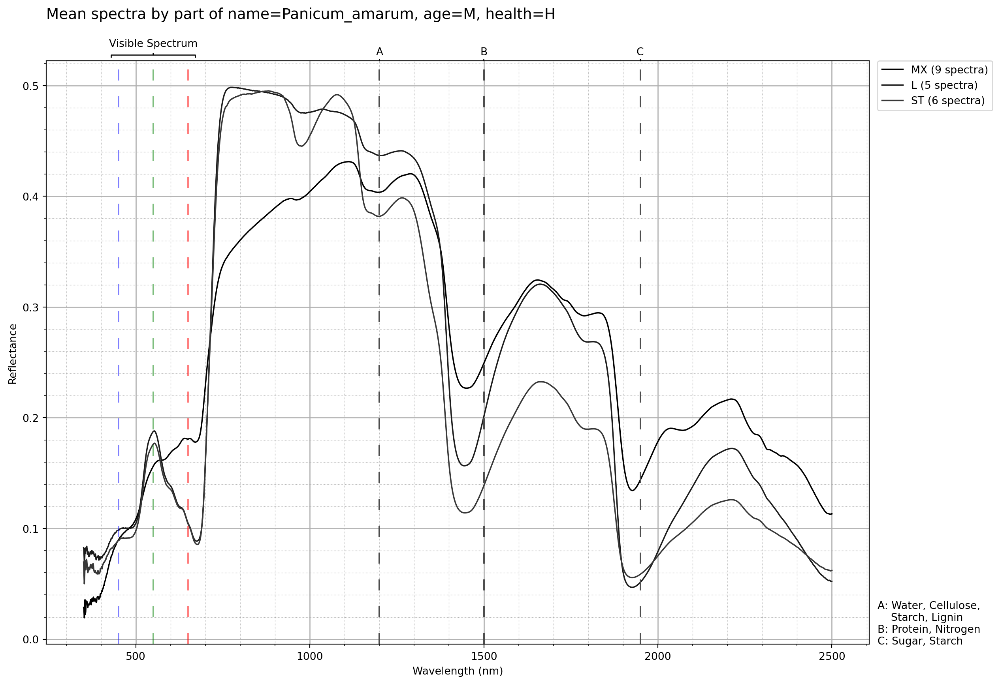

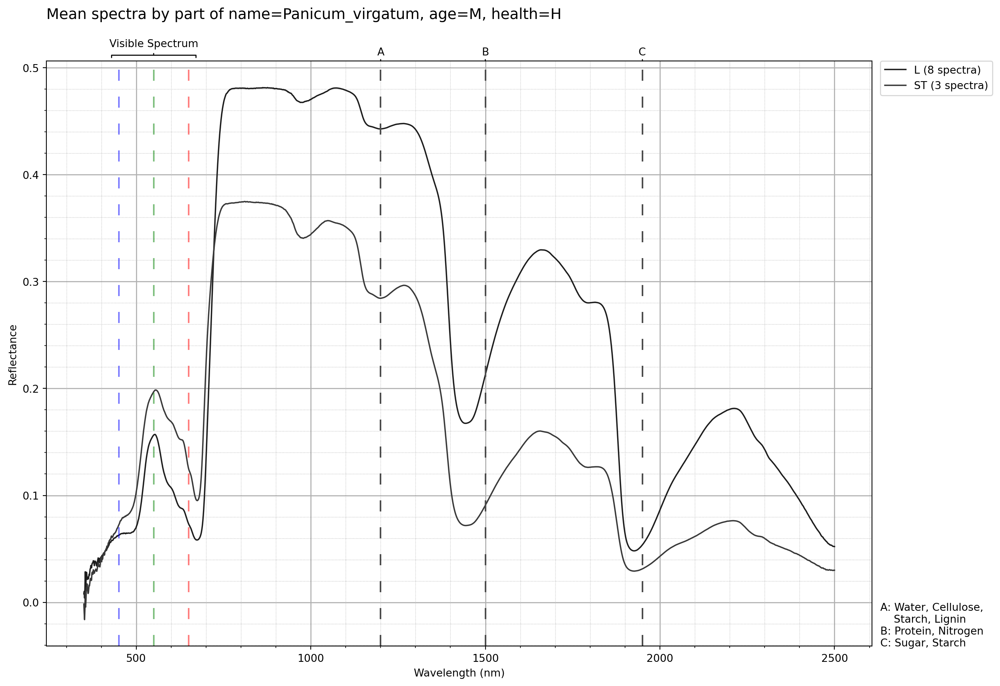

In [17]:
#| column: page

species_list = [
    'Chasmanthium_latifolium',
    'Ammophila_breviligulata',
    'Panicum_amarum',
    'Panicum_virgatum',
    #'Baccharis_halimifolia',
    #'Iva_frutescens',
    #'Solidago_sempervirens',
    #'Robinia_hispida',
    #'Morella_pennsylvanica',
    #'Rosa_rugosa',
    #'Chamaecrista_fasciculata',
    #'Solidago_rugosa',
    #'Ilex_vomitoria'

]

filter = {
    'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    'age': 'M',
    'health': 'H',
    #'part': '',
    #'type': '',
    #'bloom': '',
    #'date': ''
}

plotby = 'part'

for species in species_list:
    filter['name'] = species
    sc.plot_with_filter(filter, plotby)

## Same part of different plant over time

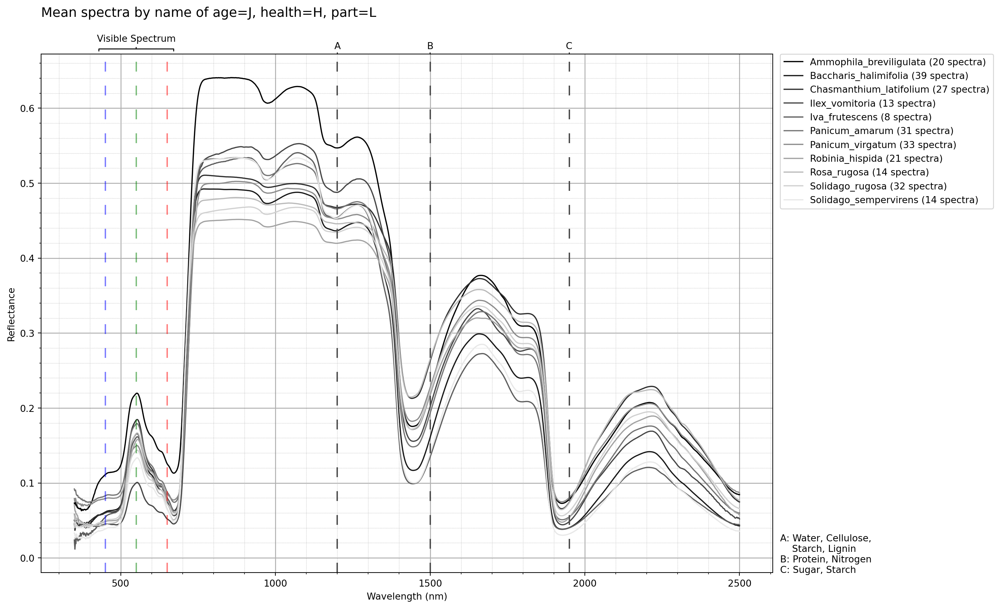

In [18]:
#| column: page

# species_list = [
#     'Chasmanthium_latifolium',
#     'Ammophila_breviligulata',
#     'Panicum_amarum',
#     'Panicum_virgatum',
#     #'Baccharis_halimifolia',
#     #'Iva_frutescens',
#     #'Solidago_sempervirens',
#     #'Robinia_hispida',
#     #'Morella_pennsylvanica',
#     #'Rosa_rugosa',
#     #'Chamaecrista_fasciculata',
#     #'Solidago_rugosa',
#     #'Ilex_vomitoria'

# ]

filter = {
    #'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    'age': 'J',
    'health': 'H',
    'part': 'L',
    #'type': '',
    #'bloom': '',
    #'date': ''
}

plotby = 'name'

# for species in species_list:
#     filter['name'] = species
#     sc.plot_with_filter(filter, plotby)

sc.plot_with_filter(filter, plotby)

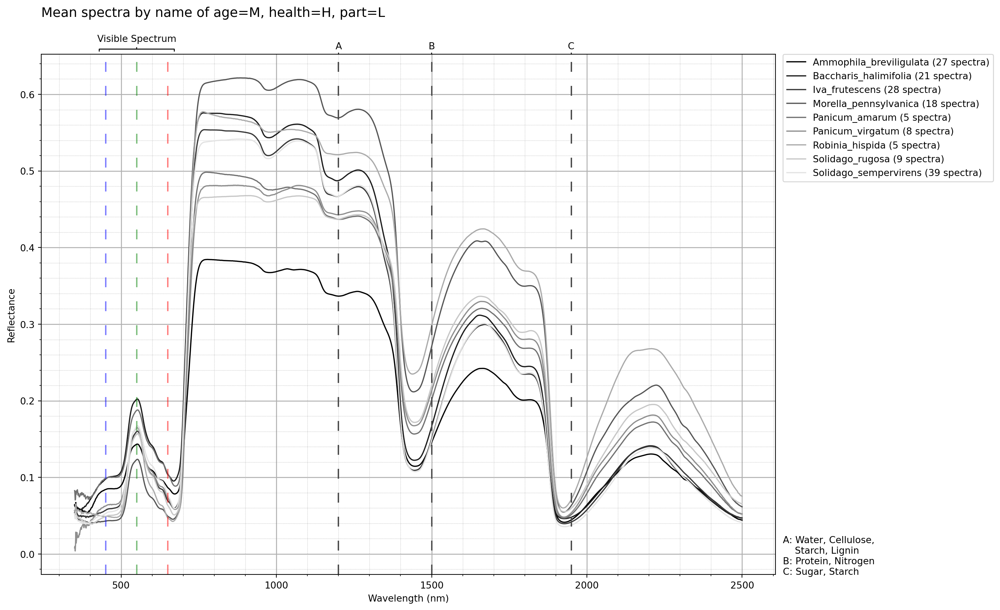

In [19]:
#| column: page

# species_list = [
#     'Chasmanthium_latifolium',
#     'Ammophila_breviligulata',
#     'Panicum_amarum',
#     'Panicum_virgatum',
#     #'Baccharis_halimifolia',
#     #'Iva_frutescens',
#     #'Solidago_sempervirens',
#     #'Robinia_hispida',
#     #'Morella_pennsylvanica',
#     #'Rosa_rugosa',
#     #'Chamaecrista_fasciculata',
#     #'Solidago_rugosa',
#     #'Ilex_vomitoria'

# ]

filter = {
    #'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    'age': 'M',
    'health': 'H',
    'part': 'L',
    #'type': '',
    #'bloom': '',
    #'date': ''
}

plotby = 'name'

# for species in species_list:
#     filter['name'] = species
#     sc.plot_with_filter(filter, plotby)

sc.plot_with_filter(filter, plotby)

## 'RE' Age Plots

::: {.callout-note}
Note the unusual incline after the red edge for spectra originally tagged with 'RE' (before mapping to '1G').
:::

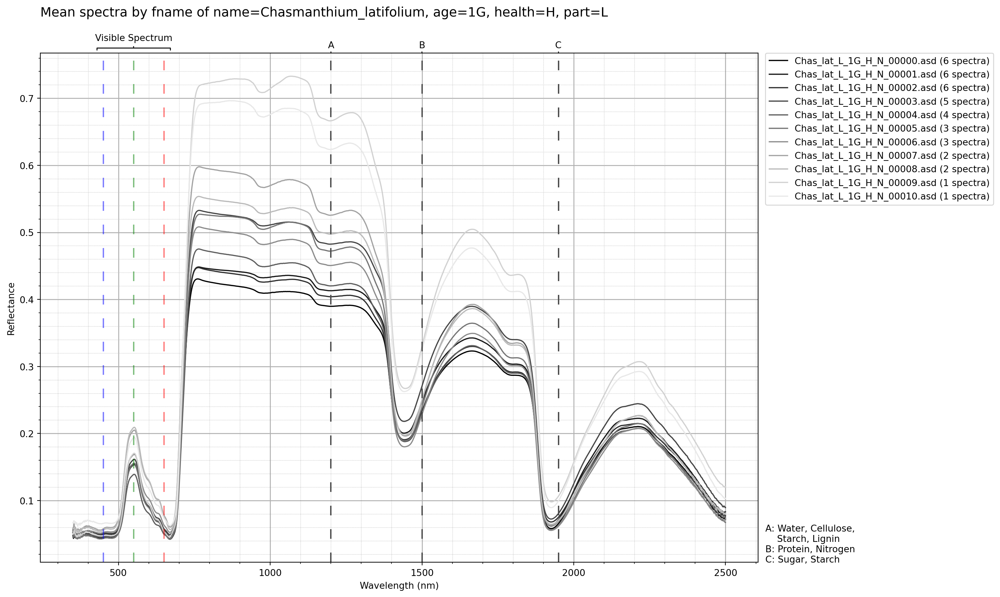

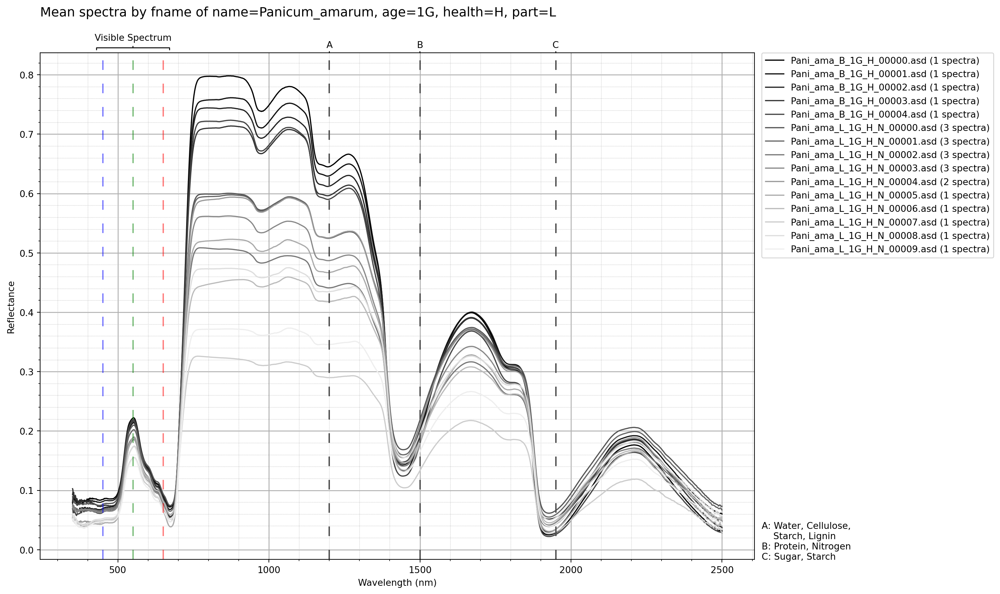

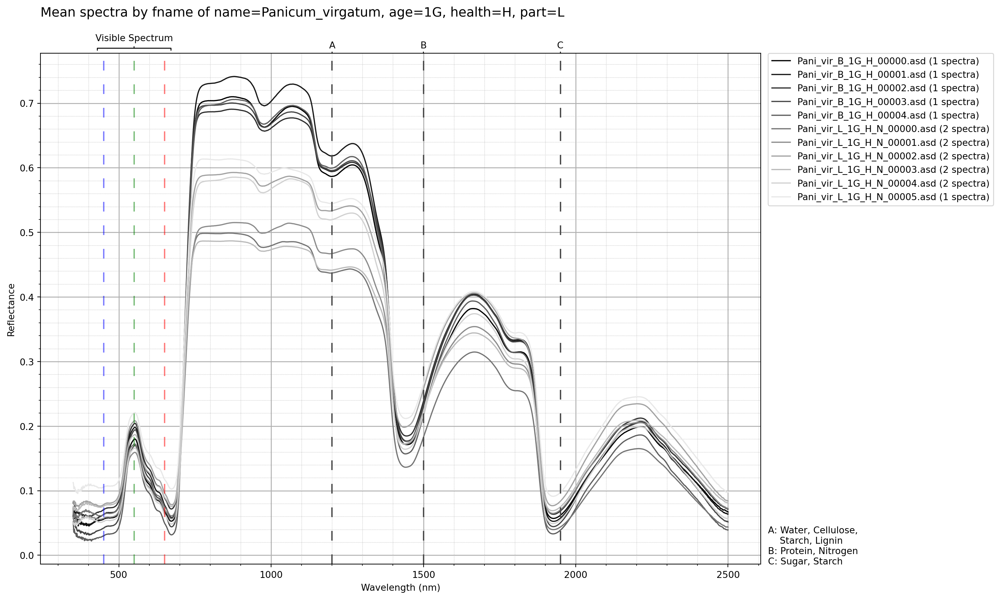

In [20]:
#| column: page

# Note the unusual incline after the red edge

species_list = [
    'Chasmanthium_latifolium',
    #'Ammophila_breviligulata',
    'Panicum_amarum',
    'Panicum_virgatum',
    #'Baccharis_halimifolia',
    #'Iva_frutescens',
    #'Solidago_sempervirens',
    #'Robinia_hispida',
    #'Morella_pennsylvanica',
    #'Rosa_rugosa',
    #'Chamaecrista_fasciculata',
    #'Solidago_rugosa',
    #'Ilex_vomitoria'

]

filter = {
    'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    'age': '1G',
    'health': 'H',
    'part': 'L',
    #'type': '',
    #'bloom': '',
    #'time': '20240221_13'
}

plotby = 'fname'

for species in species_list:
    filter['name'] = species
    sc.plot_with_filter(filter, plotby)

## Previous example to show spectral distinctions between parts of the same plant

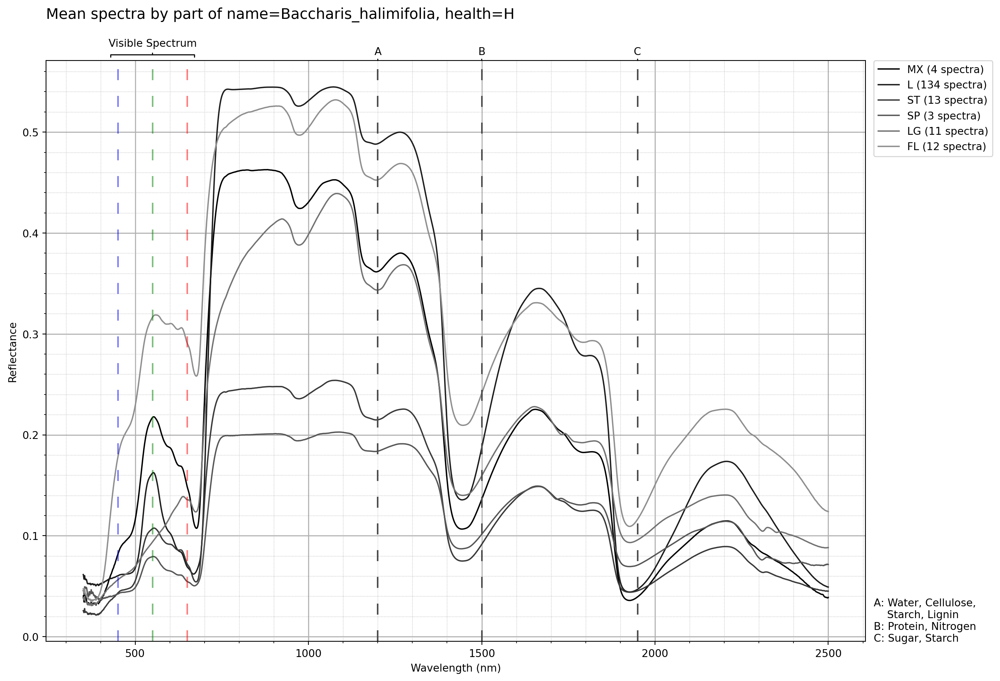

In [21]:
#| column: page

# Note the unusual incline after the red edge

species_list = [
    #'Chasmanthium_latifolium',
    #'Ammophila_breviligulata',
    #'Panicum_amarum',
    #'Panicum_virgatum',
    'Baccharis_halimifolia',
    #'Iva_frutescens',
    #'Solidago_sempervirens',
    #'Robinia_hispida',
    #'Morella_pennsylvanica',
    #'Rosa_rugosa',
    #'Chamaecrista_fasciculata',
    #'Solidago_rugosa',
    #'Ilex_vomitoria'

]

filter = {
    'name': '',
    #'fname': '',
    #'genus': '',
    #'species': '',
    #'age': '',
    'health': 'H',
    #'part': '',
    #'type': '',
    #'bloom': '',
    #'time': '20240221_13'
}

plotby = 'part'

for species in species_list:
    filter['name'] = species
    sc.plot_with_filter(filter, plotby)